<a href="https://colab.research.google.com/github/corrosivelogic/S23DR/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup

In [ ]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

if IN_COLAB:
    !pip install git+http://hf.co/usm3d/tools.git

In [ ]:
if IN_COLAB:
    !huggingface-cli login

## Data Download, Analysis, and Visualization

In [ ]:
import hoho
from hoho import *

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter
import itertools
import datasets
import trimesh
from tqdm.notebook import tqdm
import webdataset as wds
from huggingface_hub import hf_hub_download
import sys

### Load the hoho package



In [ ]:
# One shard of the dataset
data_dir = Path('./data/')
data_dir.mkdir(exist_ok=True)

dataset = wds.WebDataset(hf_hub_download(repo_id='usm3d/hoho-train-set',
            filename='data/train/hoho_v3_000-of-032.tar.gz',
            repo_type="dataset", local_dir = str(data_dir)))

split = 'all'
hoho.LOCAL_DATADIR = hoho.setup(data_dir)


hoho_v3_000-of-032.tar.gz:   0%|          | 0.00/1.01G [00:00<?, ?B/s]

/home/jack/dev/hoho_2k_subset_v2/handcrafted_prod/notebooks
total 60M
drwxr-xr-x 2 jack jack 4.0K Mar 15 15:53 .ipynb_checkpoints
drwxr-xr-x 3 jack jack 4.0K Mar 15 15:54 data
-rw-r--r-- 1 jack jack  39K Mar 15 17:51 input_images_e7ae31b220c.webp
drwxr-xr-x 8 jack jack 4.0K Mar 30 21:23 ..
-rw-r--r-- 1 jack jack  51K Apr  1 22:19 input_images_3848f53011f.webp
-rw-r--r-- 1 jack jack  39K Apr  1 22:25 input_images_25c16d1d217.webp
-rw-r--r-- 1 jack jack  14M Apr  1 23:18 EDA_backup.ipynb
-rw-r--r-- 1 jack jack  49K Apr  2 00:04 input_images_c7da2db4cb7.webp
-rw-r--r-- 1 jack jack  32M Apr  2 02:07 EDA_backup2.ipynb
-rw-r--r-- 1 jack jack  56K Apr  2 05:29 input_images_5dc2affc70b.webp
-rw-r--r-- 1 jack jack 2.2M Apr  2 14:39 houses.html
-rw-r--r-- 1 jack jack  45K Apr  2 14:39 input_images_52eb151cab2.webp
-rw-r--r-- 1 jack jack  42K Apr  2 14:58 input_images_2445c43d762.webp
-rw-r--r-- 1 jack jack  13M Apr 15 18:22 EDA.ipynb
-rw-r--r-- 1 jack jack 215K Apr 15 18:23 example_on_training.i

In [ ]:
from hoho.vis import line
from hoho import vis


In [ ]:
from hoho import compute_WED

### Retrieve one training sample


In [ ]:
next(iter(hoho.get_dataset(split=split)))

{'__key__': <class 'str'>, '__imagekey__': [<class 'str'>], '__url__': <class 'str'>, 'ade20k': [<class 'PIL.Image.Image'>], 'depthcm': [<class 'PIL.Image.Image'>], 'gestalt': [<class 'PIL.Image.Image'>], 'wf_vertices': (30, 3), 'wf_edges': (32, 2), 'edge_semantics': (32,), 'mesh_vertices': (380, 3), 'mesh_faces': (236, 4), 'face_semantics': (236,), 'K': (3, 3, 3), 'R': (3, 3, 3), 't': (3, 3), 'images': <class 'bytes'>, 'points3d': <class 'bytes'>, 'cameras': <class 'bytes'>}

In [ ]:
next(iter(hoho.get_dataset(split='all')))

{'__key__': <class 'str'>, '__imagekey__': [<class 'str'>], '__url__': <class 'str'>, 'ade20k': [<class 'PIL.Image.Image'>], 'depthcm': [<class 'PIL.Image.Image'>], 'gestalt': [<class 'PIL.Image.Image'>], 'wf_vertices': (30, 3), 'wf_edges': (32, 2), 'edge_semantics': (32,), 'mesh_vertices': (380, 3), 'mesh_faces': (236, 4), 'face_semantics': (236,), 'K': (3, 3, 3), 'R': (3, 3, 3), 't': (3, 3), 'images': <class 'bytes'>, 'points3d': <class 'bytes'>, 'cameras': <class 'bytes'>}

### Compute edge statistics

In [ ]:
EDGE_CLASSES = {
    'eave': 0,
    'ridge': 1,
    'step_flashing': 2,
    'rake': 3,
    'flashing': 4,
    'post': 5,
    'valley': 6,
    'hip': 7,
    "transition_line": 8
}

def count(row):
    # names = [*color_mappings.gestalt_color_mapping.keys()]
    names = [*EDGE_CLASSES.keys()]
    start = dict(zip(names, itertools.repeat(0)))
    add = {'num_verts': len(row['wf_vertices']), 'num_edges': len(row['wf_edges']), **Counter([names[cidx] for cidx in row['edge_semantics']])}
    start.update(add)
    return start



next(iter(hoho.get_dataset(decode=None, split=split).map(count)))



{'eave': 10,
 'ridge': 2,
 'step_flashing': 4,
 'rake': 11,
 'flashing': 5,
 'post': 0,
 'valley': 0,
 'hip': 0,
 'transition_line': 0,
 'num_verts': 30,
 'num_edges': 32,
 '__key__': '3848f53011f'}

In [ ]:
next(iter(hoho.get_dataset(split=split)))['edge_semantics']

array([0, 4, 0, 3, 0, 3, 2, 0, 3, 1, 1, 3, 0, 3, 3, 3, 0, 3, 4, 2, 4, 3,
       0, 2, 4, 2, 4, 0, 3, 0, 3, 0])

In [ ]:
counts = datasets.Dataset.from_list([*tqdm(hoho.get_dataset(decode=None, split=split).map(count))])
counts



0it [00:00, ?it/s]

Dataset({
    features: ['eave', 'ridge', 'step_flashing', 'rake', 'flashing', 'post', 'valley', 'hip', 'transition_line', 'num_verts', 'num_edges', '__key__'],
    num_rows: 173
})

array([[<AxesSubplot: title={'center': 'eave'}>,
        <AxesSubplot: title={'center': 'ridge'}>,
        <AxesSubplot: title={'center': 'step_flashing'}>],
       [<AxesSubplot: title={'center': 'rake'}>,
        <AxesSubplot: title={'center': 'flashing'}>,
        <AxesSubplot: title={'center': 'valley'}>],
       [<AxesSubplot: title={'center': 'transition_line'}>,
        <AxesSubplot: title={'center': 'num_verts'}>,
        <AxesSubplot: title={'center': 'num_edges'}>]], dtype=object)

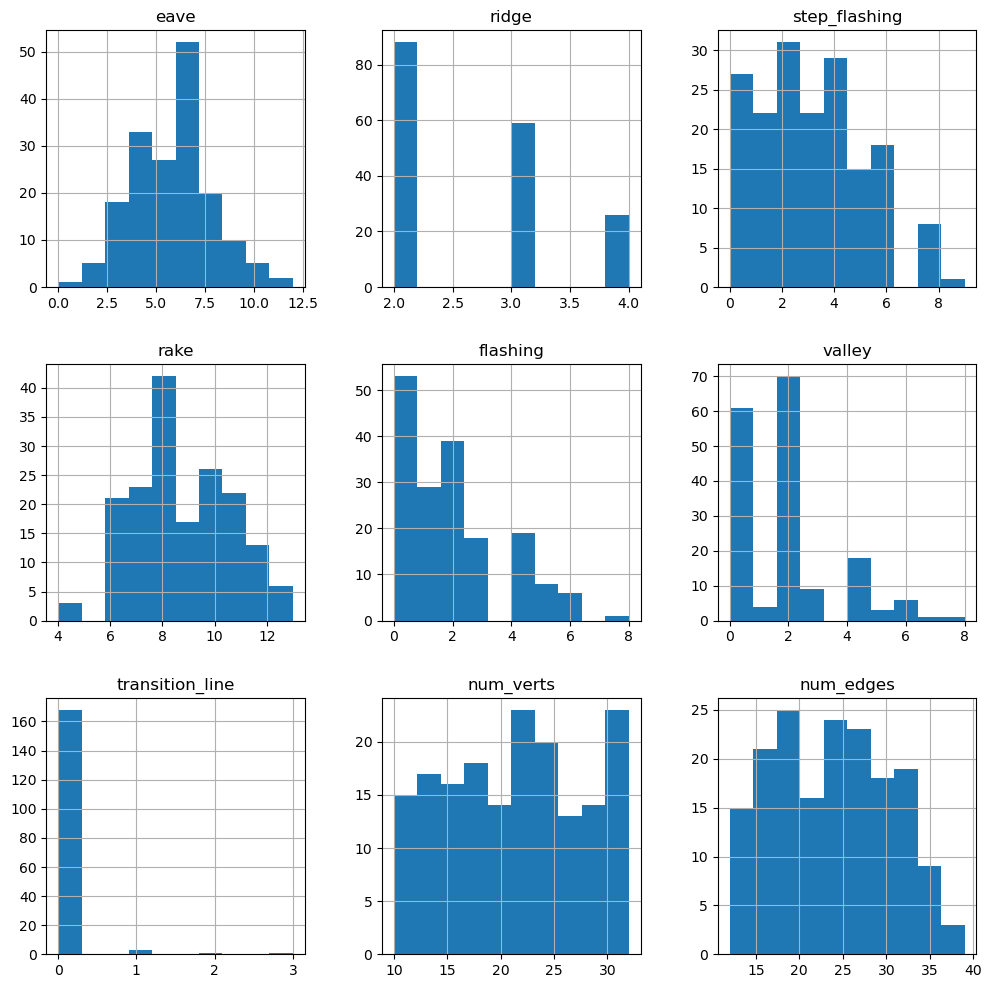

In [ ]:
df = counts.to_pandas()
df = df[ df.columns[df.max(0) != 0 ]]
df.set_index('__key__', inplace=True)
df.hist(figsize=(12,12))

In [ ]:
desc = df.describe().round(2)
desc.iloc[1:]

,eave,ridge,step_flashing,rake,flashing,valley,transition_line,num_verts,num_edges
mean,5.68,2.64,3.02,8.81,1.86,1.79,0.05,21.36,23.84
std,2.08,0.73,2.22,2.04,1.76,1.71,0.30,6.29,6.64
min,0.00,2.00,0.00,4.00,0.00,0.00,0.00,10.00,12.00
25%,4.00,2.00,1.00,7.00,0.00,0.00,0.00,16.00,19.00
50%,6.00,2.00,3.00,8.00,2.00,2.00,0.00,22.00,24.00
75%,7.00,3.00,4.00,10.00,3.00,2.00,0.00,27.00,29.00
max,12.00,4.00,9.00,13.00,8.00,8.00,3.00,32.00,39.00


In [ ]:
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm').format('{:.2f}')



,eave,ridge,step_flashing,rake,flashing,valley,transition_line,num_verts,num_edges
eave,1.00,0.58,0.12,0.69,0.06,0.54,-0.21,0.71,0.78
ridge,0.58,1.00,0.16,0.57,-0.02,0.47,-0.06,0.53,0.64
step_flashing,0.12,0.16,1.00,0.20,0.61,-0.27,0.15,0.62,0.55
rake,0.69,0.57,0.20,1.00,0.31,0.25,-0.10,0.79,0.80
flashing,0.06,-0.02,0.61,0.31,1.00,-0.12,0.12,0.62,0.55
valley,0.54,0.47,-0.27,0.25,-0.12,1.00,-0.16,0.29,0.43
transition_line,-0.21,-0.06,0.15,-0.10,0.12,-0.16,1.00,0.02,-0.02
num_verts,0.71,0.53,0.62,0.79,0.62,0.29,0.02,1.00,0.97
num_edges,0.78,0.64,0.55,0.80,0.55,0.43,-0.02,0.97,1.00


Text(0, 0.5, 'num_edges')

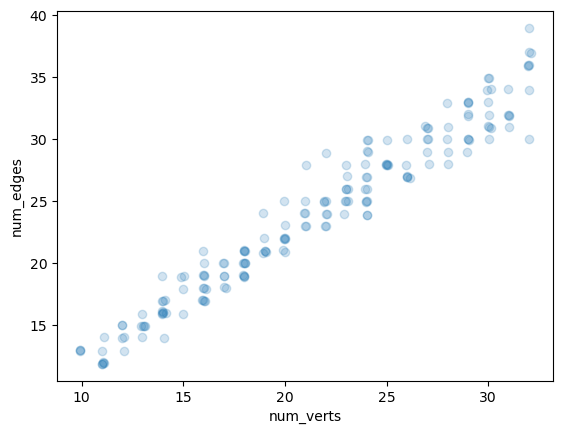

In [ ]:
xy = np.asarray(df[['num_verts', 'num_edges']]).T
xy = xy + np.random.randn(*xy.shape)*0.05
plt.scatter(*xy, alpha=.2)
plt.xlabel('num_verts')
plt.ylabel('num_edges')

(array([1, 2, 3, 4, 5, 6, 7]),
 [Text(1, 0, 'eave'),
  Text(2, 0, 'ridge'),
  Text(3, 0, 'step_flashing'),
  Text(4, 0, 'rake'),
  Text(5, 0, 'flashing'),
  Text(6, 0, 'valley'),
  Text(7, 0, 'transition_line')])

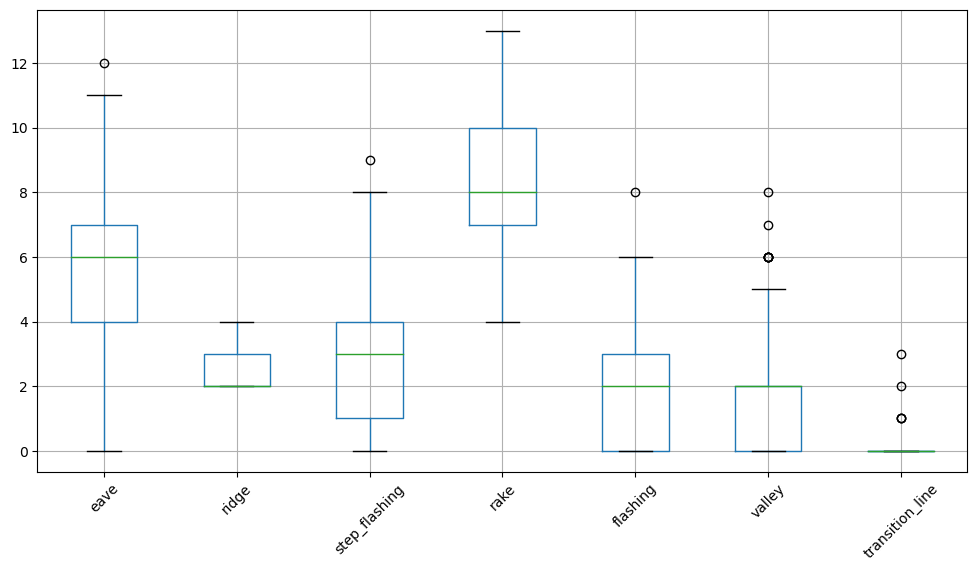

In [ ]:
df[[c for c in df.columns if not c in {'num_verts', 'num_edges'} ]].boxplot(figsize=(12, 6))
plt.xticks(rotation=45)

In [ ]:
import hoho
import datasets
hoho.setup('./data')
split = 'all'

/home/jack/dev/hoho_2k_subset_v2/handcrafted_prod/notebooks
total 60M
drwxr-xr-x 2 jack jack 4.0K Mar 15 15:53 .ipynb_checkpoints
drwxr-xr-x 3 jack jack 4.0K Mar 15 15:54 data
-rw-r--r-- 1 jack jack  39K Mar 15 17:51 input_images_e7ae31b220c.webp
drwxr-xr-x 8 jack jack 4.0K Mar 30 21:23 ..
-rw-r--r-- 1 jack jack  51K Apr  1 22:19 input_images_3848f53011f.webp
-rw-r--r-- 1 jack jack  39K Apr  1 22:25 input_images_25c16d1d217.webp
-rw-r--r-- 1 jack jack  14M Apr  1 23:18 EDA_backup.ipynb
-rw-r--r-- 1 jack jack  49K Apr  2 00:04 input_images_c7da2db4cb7.webp
-rw-r--r-- 1 jack jack  32M Apr  2 02:07 EDA_backup2.ipynb
-rw-r--r-- 1 jack jack  56K Apr  2 05:29 input_images_5dc2affc70b.webp
-rw-r--r-- 1 jack jack 2.2M Apr  2 14:39 houses.html
-rw-r--r-- 1 jack jack  45K Apr  2 14:39 input_images_52eb151cab2.webp
-rw-r--r-- 1 jack jack  42K Apr  2 14:58 input_images_2445c43d762.webp
-rw-r--r-- 1 jack jack  13M Apr 15 18:22 EDA.ipynb
-rw-r--r-- 1 jack jack 215K Apr 15 18:23 example_on_training.i

### Length / Size Statistics

In [ ]:
D = [s for i, s in enumerate(hoho.get_dataset(decode=None, split=split)) if i < 150]
dataset = datasets.Dataset.from_list(D)
dataset

Dataset({
    features: ['__key__', '__imagekey__', '__url__', 'ade20k', 'depthcm', 'gestalt', 'wf_vertices', 'wf_edges', 'edge_semantics', 'mesh_vertices', 'mesh_faces', 'face_semantics', 'K', 'R', 't', 'images', 'points3d', 'cameras'],
    num_rows: 150
})

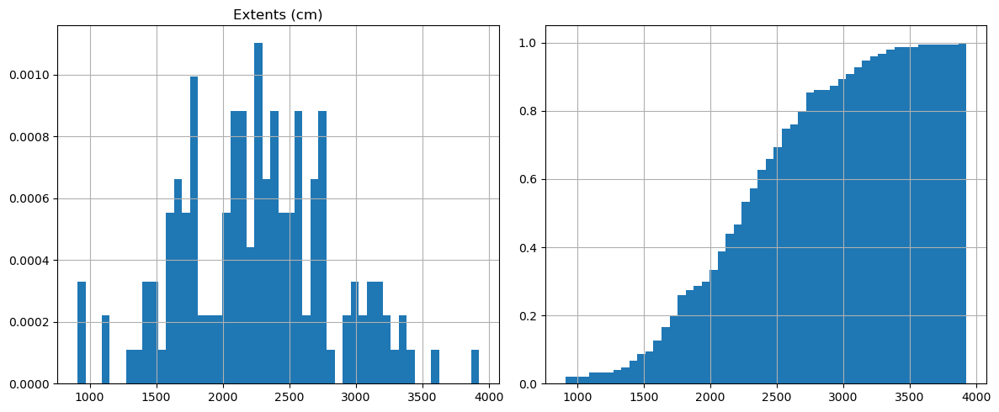

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(121)
dataset.to_pandas()['wf_vertices'].apply(lambda x: np.sqrt((np.stack(x).ptp(0)**2).sum())).hist(density=True, cumulative=False, bins=50)
plt.title('Extents (cm)')

plt.subplot(122)
dataset.to_pandas()['wf_vertices'].apply(lambda x: np.sqrt((np.stack(x).ptp(0)**2).sum())).hist(density=True, cumulative=True, bins=50)

plt.tight_layout()

In [ ]:
edge_lengths = np.concatenate(dataset.map(lambda x: {'edge': np.linalg.norm(
                                np.diff(np.asarray(x['wf_vertices'])[np.asarray(x['wf_edges'])], axis=1),
                                             axis=-1).squeeze()
                      })['edge'])

Map:   0%|          | 0/150 [00:00<?, ? examples/s]

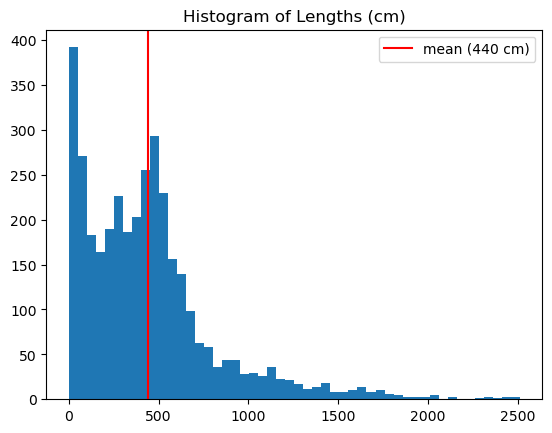

In [ ]:
mean_edge_length = np.mean(edge_lengths)

plt.hist(edge_lengths, bins=50)
plt.axvline(mean_edge_length, color='red', label=f'mean ({mean_edge_length:.0f} cm)')
plt.title('Histogram of Lengths (cm)')
plt.legend()
plt.show()

### Visualize a few samples

In [ ]:
D = dataset.select(range(100))
D

Dataset({
    features: ['__key__', '__imagekey__', '__url__', 'ade20k', 'depthcm', 'gestalt', 'wf_vertices', 'wf_edges', 'edge_semantics', 'mesh_vertices', 'mesh_faces', 'face_semantics', 'K', 'R', 't', 'images', 'points3d', 'cameras'],
    num_rows: 100
})

In [ ]:
grid = vis.show_grid(list(dataset.select(range(25)).to_pandas().apply(lambda x: vis.show_wf(x, radius=50), axis=1)), row_length=5).show()
with open('houses.html', 'w') as f:
    f.write(grid.data)

grid

In [ ]:
vis.show_grid(list(dataset.select(range(100)).to_pandas().apply(vis.show_wf, axis=1)), row_length=10).show()



In [ ]:
row_order = next(iter(hoho.get_dataset(decode=None, split=split).map(hoho.decode)))
row_order

{'__key__': <class 'str'>, '__imagekey__': [<class 'str'>], '__url__': <class 'str'>, 'ade20k': [<class 'PIL.WebPImagePlugin.WebPImageFile'>], 'depthcm': [<class 'PIL.PngImagePlugin.PngImageFile'>], 'gestalt': [<class 'PIL.WebPImagePlugin.WebPImageFile'>], 'wf_vertices': (30, 3), 'wf_edges': (32, 2), 'edge_semantics': (32,), 'mesh_vertices': (380, 3), 'mesh_faces': (236, 4), 'face_semantics': (236,), 'K': (3, 3, 3), 'R': (3, 3, 3), 't': (3, 3), 'images': <class 'dict'>, 'points3d': <class 'dict'>, 'cameras': <class 'dict'>}

In [ ]:
row_order['__key__']

'3848f53011f'

In [ ]:

def to_K(f, cx, cy):
    K = np.eye(3)
    K[0,0] = K[1,1] = f
    K[0,2] = cx
    K[1,2] = cy
    return K

def quaternion_to_rotation_matrix(qvec):
    qw, qx, qy, qz = qvec
    R = np.array([
        [1 - 2*qy**2 - 2*qz**2, 2*qx*qy - 2*qz*qw, 2*qx*qz + 2*qy*qw],
        [2*qx*qy + 2*qz*qw, 1 - 2*qx**2 - 2*qz**2, 2*qy*qz - 2*qx*qw],
        [2*qx*qz - 2*qy*qw, 2*qy*qz + 2*qx*qw, 1 - 2*qx**2 - 2*qy**2]
    ])
    return R

col_cams = [hoho.Rt_to_eye_target(row_order['ade20k'][0], to_K(*row_order['cameras'][1].params), quaternion_to_rotation_matrix(colmap_img.qvec), colmap_img.tvec) for colmap_img in row_order['images'].values()]
eye, target, up, fov = col_cams[0]


cameras, images, points3D = row_order['cameras'], row_order['images'], row_order['points3d']
xyz = np.stack([p.xyz for p in points3D.values()])
color = np.stack([p.rgb for p in points3D.values()])
pcd = trimesh.Scene([trimesh.PointCloud(vertices=xyz, colors=color)])

V, E = row_order['wf_vertices'], row_order['wf_edges']
wf = vis.show_wf(row_order)

ax = [line((0,0,0), 1200*b, c=255*b, radius=15) for b in np.eye(3)]

u = trimesh.Trimesh(vertices=row_order['mesh_vertices'] , faces=row_order['mesh_faces'][:, 1:])

cams = trimesh.Scene([line(eye, (eye + 200*(target - eye)), radius=6) for eye, target, up, fov in itertools.starmap(hoho.Rt_to_eye_target, zip(*[row_order[k] for k in 'ade20k K R t'.split()]))])
cams_colmap = trimesh.Scene([line(eye, (eye + 200*(target - eye)), radius=6, c=(0,0,255)) for eye, target, up, fov in col_cams])


trimesh.Scene([
        u,
        ax,
        cams,
        cams_colmap,
        pcd,
        *wf
    ]).show()

In [ ]:
trimesh.Scene([
        # u,
        ax,
        cams,
        cams_colmap,
        pcd,
        *wf
    ]).show()

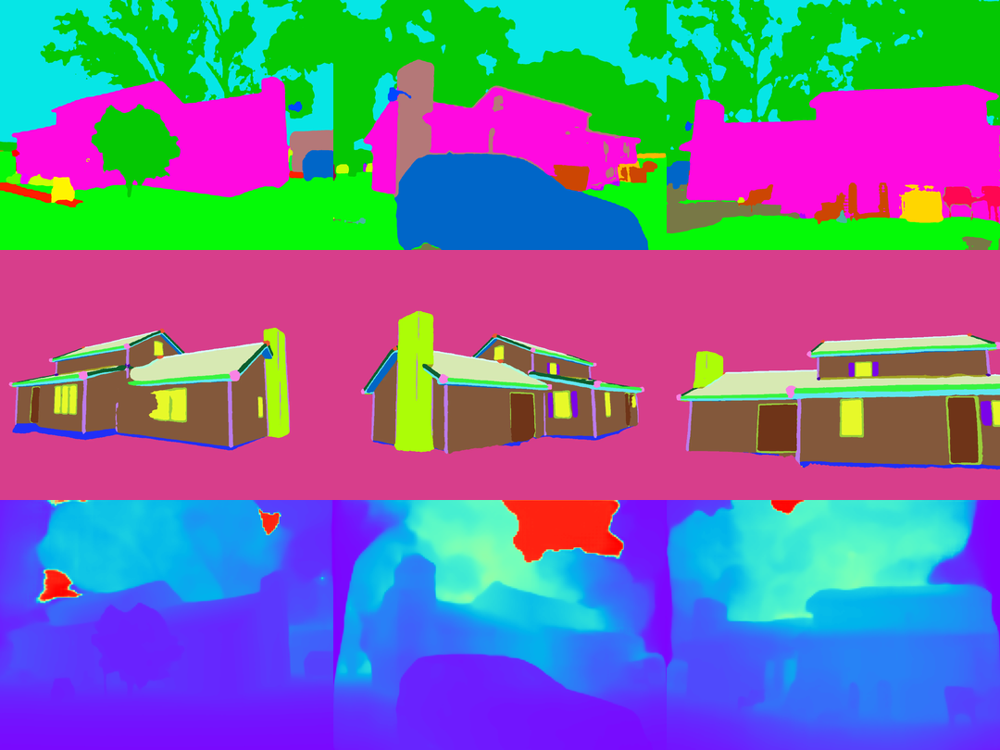

In [ ]:
vis.visualize_order_images(row_order)

In [ ]:
vis.visualize_order_images(row_order).save(f"input_images_{row_order['__key__']}.webp")

In [ ]:
trimesh.Scene([
        # u,
        ax,
        cams,
        cams_colmap,
        pcd,
        # *wf
    ]).show()

In [ ]:
trimesh.Scene([
        # u,
        ax,
        cams,
        cams_colmap,
        pcd,
        *wf
    ]).show()

In [ ]:
trimesh.Scene([
        # u,
        ax,
        # cams,
        # cams_colmap,
        # pcd,
        *wf
    ]).show()

In [ ]:
def empty_solution():
    '''Return a minimal valid solution, i.e. 2 vertices and 1 edge.'''
    return np.zeros((2,3)), [(0, 1)], [0]

vert, edges, sem = empty_solution()

In [ ]:
wed = compute_WED(vert,
                  edges,
                  np.array(row_order['wf_vertices']),
                  np.array(row_order['wf_edges']),
                  1.0, 1.0)
print (f"WED for empty prediction for single scene is {wed:.4f}")

WED for empty prediction for single scene is 1.0753


In [ ]:
wed = compute_WED(vert,
                  edges,
                  np.array(row_order['wf_vertices']),
                  np.array(row_order['wf_edges']),
                  cv=mean_edge_length, ce=1)
print (f"WED for empty prediction for single scene is {wed:.4f}")

WED for empty prediction for single scene is 34.1383


In [ ]:
wed = compute_WED(vert,
                  edges,
                  np.array(row_order['wf_vertices']),
                  np.array(row_order['wf_edges']),
                  cv=1, ce=mean_edge_length)
print (f"WED for empty prediction for single scene is {wed:.4f}")

WED for empty prediction for single scene is 440.3807
